# Map it all together

Combine the CMAQ response with the PM2.5 sensor values and wind directions, speeds, and pressure

In [1]:
def clear_except(*args):
  """Deletes all variables except those specified as arguments."""
  global_vars = globals().copy()
  for var_name in global_vars:
    if not var_name.startswith("_") and var_name != "clear_except" and var_name not in args:
      del globals()[var_name]

In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

In [3]:
def to_gdf(df, lat_col='latitude', lon_col='longitude'):
    return gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df[lon_col], df[lat_col]), crs="EPSG:4326")

In [4]:
wind = pd.read_csv("meteostat/daily_wind_station_data_loc_2010-2021.csv.gz", dtype = {'station': 'string'})
windgeo = to_gdf(wind)
windgeo

,station,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,latitude,longitude,geometry
0,69007,2021-01-02,8.6,5.0,12.0,2.2,NaN,43.0,5.9,NaN,1024.2,NaN,36.6815,-121.7617,POINT (-121.76 36.681)
1,69007,2021-01-03,10.5,9.0,15.0,1.0,NaN,74.0,5.6,NaN,1024.0,NaN,36.6815,-121.7617,POINT (-121.76 36.681)
2,69007,2021-01-04,9.7,5.0,15.0,2.2,NaN,173.0,10.2,NaN,1022.2,NaN,36.6815,-121.7617,POINT (-121.76 36.681)
3,69007,2021-01-05,7.4,2.0,15.0,0.0,NaN,69.0,6.4,NaN,1024.3,NaN,36.6815,-121.7617,POINT (-121.76 36.681)
4,69007,2021-01-06,7.8,3.0,16.0,0.0,NaN,69.0,4.5,NaN,1023.4,NaN,36.6815,-121.7617,POINT (-121.76 36.681)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4003578,U9ANI,2021-12-27,1.0,0.0,3.3,0.0,NaN,258.0,24.7,NaN,1016.6,NaN,33.0833,-116.6300,POINT (-116.63 33.083)
4003579,U9ANI,2021-12-28,1.1,0.6,3.3,40.1,NaN,261.0,27.4,NaN,1011.4,NaN,33.0833,-116.6300,POINT (-116.63 33.083)
4003580,U9ANI,2021-12-29,2.4,-0.6,3.9,16.0,NaN,226.0,12.8,NaN,1013.5,NaN,33.0833,-116.6300,POINT (-116.63 33.083)
4003581,U9ANI,2021-12-30,3.7,0.6,6.7,2.5,NaN,90.0,7.3,NaN,1012.6,NaN,33.0833,-116.6300,POINT (-116.63 33.083)


In [5]:
year = 2010

In [6]:
cmaq = pd.read_csv(f"CMAQ/summarized/{year}_CMAQ_5x5.csv.gz")
cmaqSquares = gpd.read_file(f"CMAQ/summarized/{year}_CMAQ_5x5_squares.shp")

In [7]:
PM25_88101 = pd.read_csv(f"PM2.5/daily_88101_{year}.zip")
PM25_88502 = pd.read_csv(f"PM2.5/daily_88502_{year}.zip", low_memory=False)
PM25_88101.shape

(230028, 29)

In [8]:
PM25 = pd.concat((PM25_88101, PM25_88502))
PM25.shape

(588346, 29)

In [9]:
states = gpd.read_file("cb_2018_us_state_5m.zip")

In [10]:
# remove non-contiguous US locations
states = states[~states["NAME"].isin(
    {"United States Virgin Islands", 
     "Alaska", "Hawaii", "Puerto Rico", 
     "American Samoa", "Commonwealth of the Northern Mariana Islands", 
     "Guam"})]

In [11]:
PM25geo = to_gdf(PM25, 'Latitude', 'Longitude')

In [12]:
m = cmaqSquares.explore(color='grey')
m = PM25geo.drop_duplicates(('Latitude', 'Longitude')).explore(m=m, color='blue')
windgeo.drop_duplicates('station').explore(m=m, color='red')

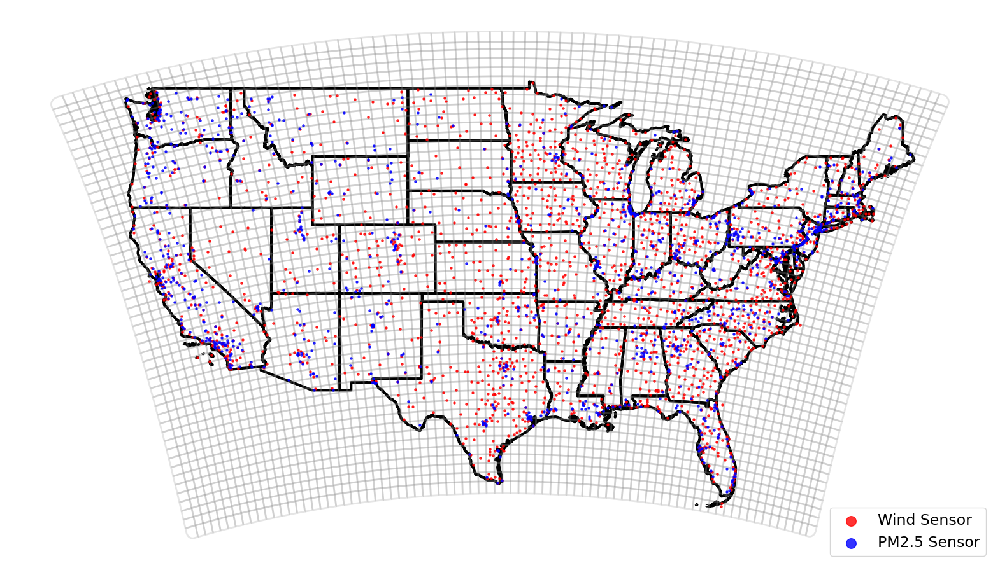

In [13]:
cmaqSquares4326 = cmaqSquares.to_crs("EPSG:4326")
cmaqSquares4326ex = cmaqSquares4326.boundary

PMplt = PM25geo.drop_duplicates(('Latitude', 'Longitude')).to_crs("EPSG:4326").overlay(cmaqSquares4326, how='intersection')
windplt = windgeo.drop_duplicates('station').to_crs("EPSG:4326").overlay(cmaqSquares4326, how='intersection')

m = states.boundary.plot(linewidth = 3, color = 'black', figsize=(20,15), zorder=0)
m = cmaqSquares4326ex.plot(ax = m,color = 'grey', linewidth = 2, alpha = 0.2, zorder=2)
m = windplt.plot(ax = m, color = 'red', zorder=5, markersize = 5, alpha = 0.8, label = "Wind Sensor")
m = PMplt.plot(ax = m, color = 'blue', zorder=10, markersize = 5, alpha = 0.8, label = "PM2.5 Sensor").set_axis_off()
plt.legend(loc='lower right', markerscale = 5, prop={'size': 17})
# plt.savefig('dataMap.svg')
# plt.savefig('dataMap.png', dpi=300, bbox_inches = 'tight')

# Bring it all together

<Axes: >

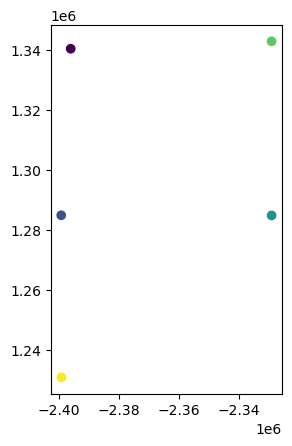

In [14]:
# apparently the cmaqSquares are not in order so I can't put them into a rectangular matrix
# i'll sort by the x and y values so that I can actually make a 2d array
squareCentroids = gpd.GeoDataFrame({'i': list(cmaqSquares.index)}, geometry=cmaqSquares.centroid)
type(squareCentroids)
squareCentroids
squareCentroids.iloc[0:5,].plot(column='i')

In [15]:
# based on what's above, there are rounding issues or small deviations
# remove rounding errors (round within 0.02e6) 
roundedX = (squareCentroids.geometry.x / 0.02e6).round() * 0.02e6
roundedY = (squareCentroids.geometry.y / 0.02e6).round() * 0.02e6

In [16]:
roundedX

0      -2400000.0
1      -2400000.0
2      -2320000.0
3      -2320000.0
4      -2400000.0
          ...    
3995    2360000.0
3996    2360000.0
3997    2360000.0
3998    2360000.0
3999    2360000.0
Length: 4000, dtype: float64

In [17]:
# Get the sorted indices by x, then y
sorted_indices = sorted(range(len(cmaqSquares)), key=lambda i: (roundedX[i], -roundedY[i]))
# display(sorted_indices)
# # Reorder the GeoDataFrame
sortedcmaqSquares = cmaqSquares.iloc[sorted_indices].reset_index(drop=True)
sortedcmaqSquares['newFID'] = list(sortedcmaqSquares.index)
sortedcmaqSquares.explore(column='newFID')

In [18]:
# # quick chatgpt widget to make sure all of the points are in order, they look good
# # weird rounding issues, but everything is still correct i think

# %matplotlib widget

# from matplotlib.widgets import Slider
# import numpy as np

# # Extract x, y coordinates
# x = roundedX[sorted_indices]
# y = roundedY[sorted_indices]

# # Set up the figure
# fig, ax = plt.subplots()
# plt.subplots_adjust(bottom=0.25)

# # All points (invisible by default)
# main_plot = ax.scatter([], [], c='red', s=10)

# # Set axis limits
# ax.set_xlim(x.min() - 1, x.max() + 1)
# ax.set_ylim(y.min() - 1, y.max() + 1)

# # Slider setup
# ax_slider = plt.axes([0.2, 0.1, 0.65, 0.03])
# slider = Slider(ax_slider, 'Max FID index', 0, len(sortedcmaqSquares), valinit=0, valstep=1)

# # Update function
# def update(val):
#     idx = int(slider.val)
#     main_plot.set_offsets(np.column_stack((x[:idx], y[:idx])))
#     fig.canvas.draw_idle()

# slider.on_changed(update)

# # Initial plot
# update(0)

# plt.show()

In [19]:
uniquePMDates = set(PM25geo['Date Local'].unique())
uniqueIDs = set(list(range(0, 80*50)))

In [20]:
# taken from https://ofmpub.epa.gov/rsig/rsigserver?data/FAQSD/docs/2020_DS_Annual_Report.pdf
# Lambert Conformal Projection with true latitudes at 33 and 45 N, coordinate center 97 W, 40 N, converted by ChatGPT to CRS string
cmaqCRS = (
    "+proj=lcc "
    "+lat_1=33 +lat_2=45 "        # standard parallels
    "+lat_0=40 "                  # latitude of origin
    "+lon_0=-97 "                 # central meridian
    "+x_0=0 +y_0=0 "              # false easting/northing
    "+datum=WGS84 +units=m +no_defs"
)

In [21]:
cmaqPM = sortedcmaqSquares.sjoin(PM25geo.to_crs(cmaqCRS), how='left')
cmaqWind = sortedcmaqSquares.sjoin(windgeo.to_crs(cmaqCRS), how='left')

In [22]:
clear_except('cmaqPM', 'cmaqWind', 'cmaq', 'sortedcmaqSquares', 'pd', 'plt', 'np', 'gpd')

In [23]:
display(cmaqPM.columns)
display(cmaqWind.columns)

Index(['FID', 'geometry', 'newFID', 'index_right', 'State Code', 'County Code',
       'Site Num', 'Parameter Code', 'POC', 'Latitude', 'Longitude', 'Datum',
       'Parameter Name', 'Sample Duration', 'Pollutant Standard', 'Date Local',
       'Units of Measure', 'Event Type', 'Observation Count',
       'Observation Percent', 'Arithmetic Mean', '1st Max Value',
       '1st Max Hour', 'AQI', 'Method Code', 'Method Name', 'Local Site Name',
       'Address', 'State Name', 'County Name', 'City Name', 'CBSA Name',
       'Date of Last Change'],
      dtype='object')

Index(['FID', 'geometry', 'newFID', 'index_right', 'station', 'time', 'tavg',
       'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'wpgt', 'pres', 'tsun',
       'latitude', 'longitude'],
      dtype='object')

<Axes: >

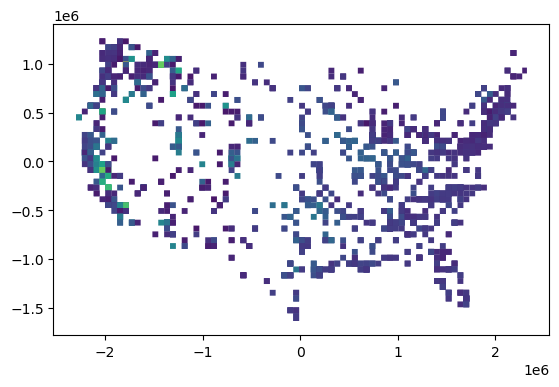

In [24]:
cmaqPM[cmaqPM['Date Local'] == '2010-01-02'].plot(column="Arithmetic Mean")

<Axes: >

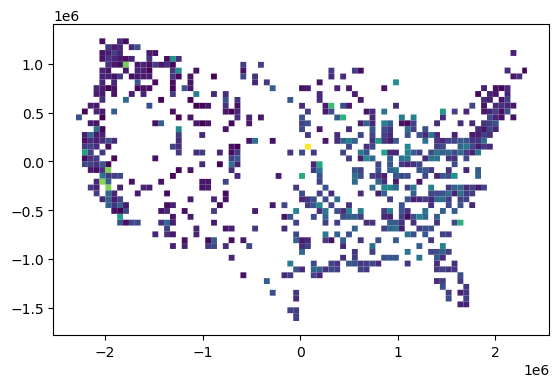

In [25]:
# one can clearly see the missing squares now, nice
cmaqPM.drop_duplicates("newFID").plot(column="Arithmetic Mean")

<Axes: >

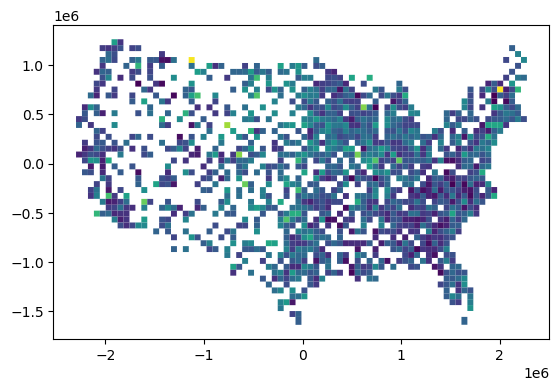

In [26]:
# same here
cmaqWind.drop_duplicates("newFID").plot(column="wspd")

# Clean wind data

In [27]:
# first, drop all NA rows
cmaqWind = cmaqWind.dropna(subset=('wdir', 'wspd'))

In [28]:
# convert wdir and wspd to x and y components
# normal math starts right and increases CCW, mateostat starts up and increases CW
# Convert angle to standard math angle
theta_rad = np.radians(90 - cmaqWind['wdir'])

# compute x and y components
cmaqWind['windX'] = cmaqWind['wspd'] * np.cos(theta_rad)
cmaqWind['windY'] = cmaqWind['wspd'] * np.sin(theta_rad)

In [29]:
# take the mean of sensor values with multiple sensors inside them, keeping NA rows for the grid
cmaqWindX = cmaqWind[['time', 'newFID', 'windX']].groupby(['time', 'newFID'], as_index=False).mean()
cmaqWindY = cmaqWind[['time', 'newFID', 'windY']].groupby(['time', 'newFID'], as_index=False).mean()
display(len(cmaqWindX['time'].unique()))

4383

In [30]:
def createWindarr(cmaqWind, windColName):
    uniqueWindDates = cmaqWind['time'].unique()
    uniqueIDs = np.arange(0, 80 * 50)
    
    # Create full combo as DataFrame (no strings)
    combos_df = pd.MultiIndex.from_product([uniqueWindDates, uniqueIDs], names=['time', 'newFID']).to_frame(index=False)
    
    # Merge with indicator to find missing combinations
    merged = combos_df.merge(cmaqWind, on=['time', 'newFID'], how='left', indicator=True)
    
    # Rows not in cmaqPMunary
    naRows = merged[merged['_merge'] == 'left_only'].drop(columns=['_merge'])
    naRows[windColName] = np.nan
    
    # Combine with existing data
    cmaqWindAllCombos = pd.concat([cmaqWind, naRows], ignore_index=True).sort_values(by=['time', 'newFID']).reset_index(drop=True)
    
    # Pivot the dataframe
    pivotedX = cmaqWindAllCombos.pivot(index='time', columns='newFID', values=windColName)

    pd.DataFrame({'time': pivotedX.index}).to_csv(f'meteostat/{windColName}dates.csv', index=False)
    
    # convert to a 3D array
    # honestly not entirely sure why I reshape to (365, 80, 50) first, then have to transpose it, but whateva
    WindX_array = pivotedX.values.reshape(len(pivotedX), 80, 50)  
    WindX_array = np.transpose(WindX_array, axes=(0, 2, 1)) # fix to 50 rows and 80 columns
    return WindX_array.copy()

WindX_array = createWindarr(cmaqWindX, 'windX')
# (days, rows, columns)
print(WindX_array.shape) 

(4383, 50, 80)


In [31]:
(~np.isnan(WindX_array)).sum()

2693007

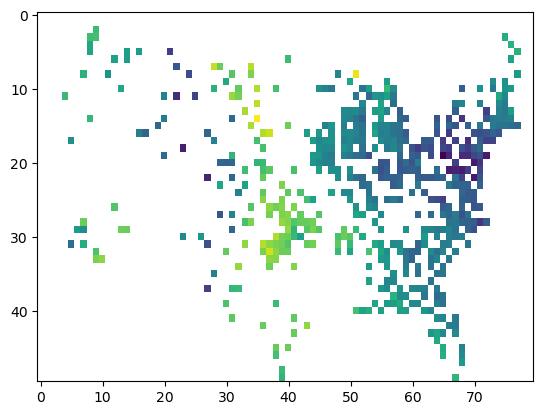

In [32]:
plt.imshow(WindX_array[1], cmap='viridis', aspect='auto')
plt.show()

In [33]:
np.save('meteostat/windX_array.npy', WindX_array)
del WindX_array

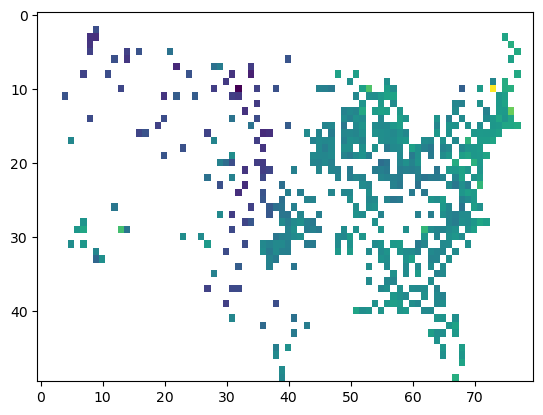

In [34]:
WindY_array = createWindarr(cmaqWindY, 'windY')
plt.imshow(WindY_array[1], cmap='viridis', aspect='auto')

In [35]:
np.save('meteostat/windY_array.npy', WindY_array)

# Do PM2.5 and CMAQ other years

In [36]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

In [37]:
def to_gdf(df, lat_col='latitude', lon_col='longitude'):
    return gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df[lon_col], df[lat_col]), crs="EPSG:4326")

states = gpd.read_file("cb_2018_us_state_5m.zip")
    
# remove non-contiguous US locations
states = states[~states["NAME"].isin(
    {"United States Virgin Islands", 
     "Alaska", "Hawaii", "Puerto Rico", 
     "American Samoa", "Commonwealth of the Northern Mariana Islands", 
     "Guam"})]

# putting this in a function so the local variables delete themselves (saves memory)
def makePMarr(cmaqPM, year):
    # take the mean of sensor values with multiple sensors inside them, keeping NA rows for the grid
    cmaqPMunary = cmaqPM[['Date Local', 'newFID', 'Arithmetic Mean']].groupby(['Date Local', 'newFID'], as_index=False).mean()
    cmaqPMunary['Date Local']
    
    uniquePMDates = set(cmaqPM['Date Local'].unique())
    uniqueIDs = set(list(range(0, 80*50)))
    
    combos = list(itertools.product(uniquePMDates, uniqueIDs))
    combos_df = pd.DataFrame(combos, columns=['Date Local', 'newFID'])
    combos_df['combined'] = combos_df['Date Local'] + "_" + combos_df['newFID'].astype('str')
    cmaqPMunary['combined'] = cmaqPMunary['Date Local'] + "_" + cmaqPMunary['newFID'].astype('str')
    combos_df = combos_df.sort_values(["Date Local", "newFID"])
    
    # Find the combinations that are NOT in cmaqPMunary
    naRows = combos_df[~combos_df['combined'].isin(cmaqPMunary['combined'])].drop('combined', axis=1).reset_index(drop=True)
    naRows['Arithmetic Mean'] = np.nan
    # naRows
    
    cmaqPMAllCombos = pd.concat((cmaqPMunary.drop('combined', axis=1), naRows), ignore_index=True).sort_values(by=['Date Local', 'newFID']).reset_index(drop=True)
    # cmaqPMAllCombos
    
    # Pivot the dataframe
    pivoted = cmaqPMAllCombos.pivot(index='Date Local', columns='newFID', values='Arithmetic Mean')
    # pivoted
    
    pd.DataFrame({'Date Local': pivoted.index}).to_csv(f'PM2.5/{year}PMdates.csv', index=False)
    
    # convert to a 3D array
    # honestly not entirely sure why I reshape to (365, 80, 50) first, then have to transpose it, but whateva
    PM_array = pivoted.values.reshape(len(pivoted), 80, 50)  
    PM_array = np.transpose(PM_array, axes=(0, 2, 1)) # fix to 50 rows and 80 columns
    return PM_array.copy()

2010


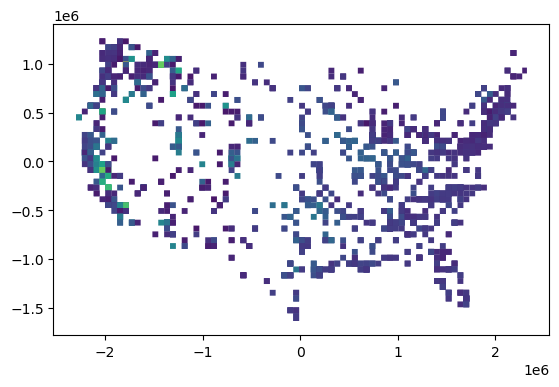

(365, 50, 80)


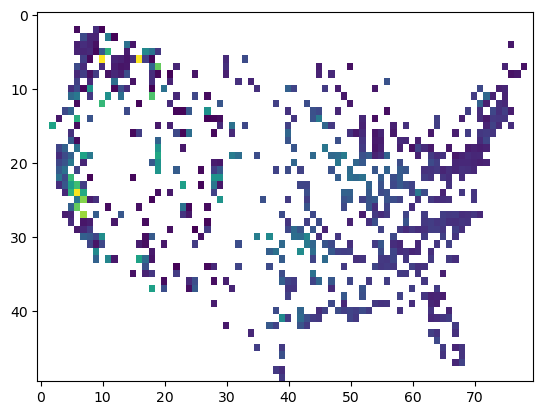

(365, 50, 80)

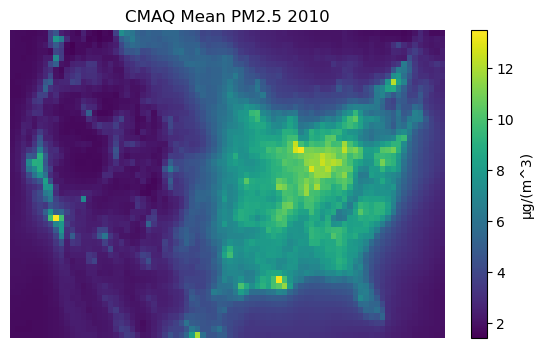

2011


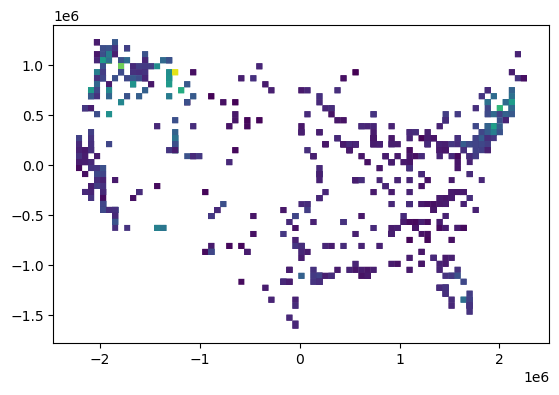

(365, 50, 80)


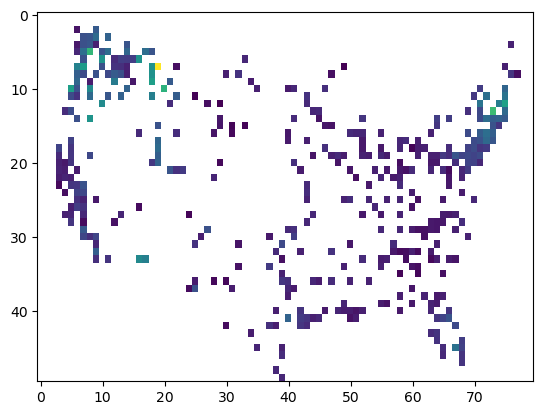

(365, 50, 80)

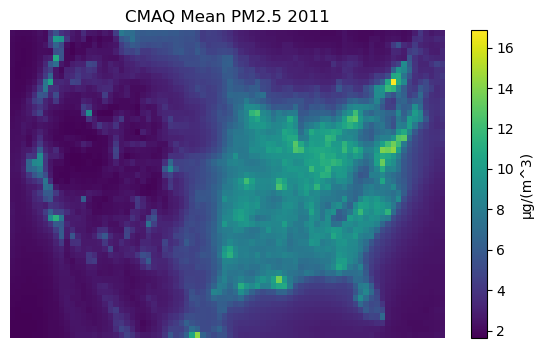

2012


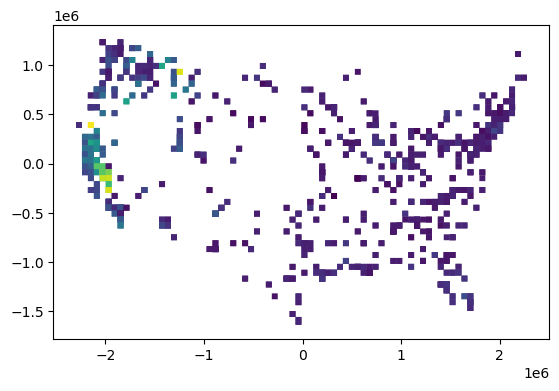

(366, 50, 80)


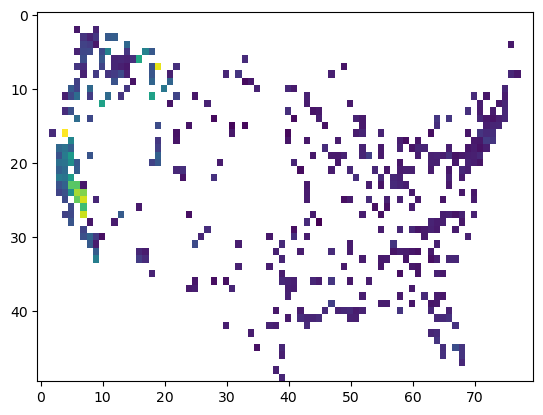

(366, 50, 80)

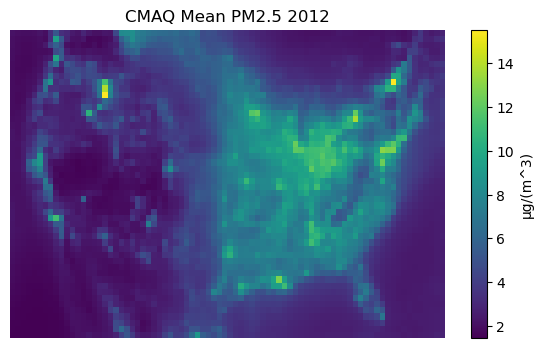

2013


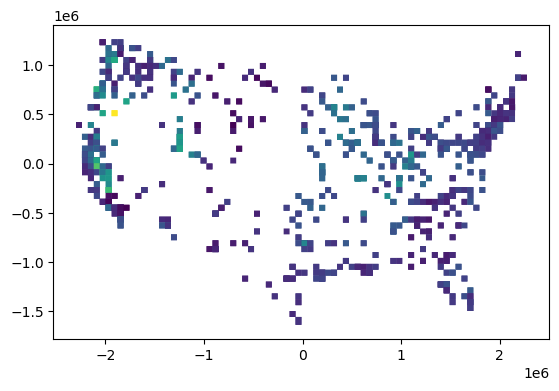

(365, 50, 80)


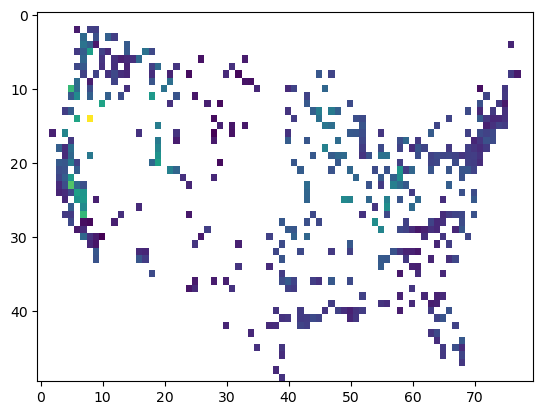

(365, 50, 80)

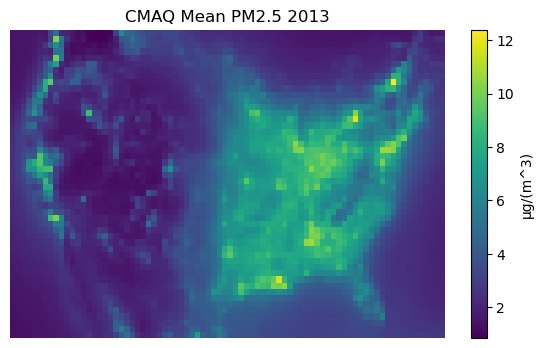

2014


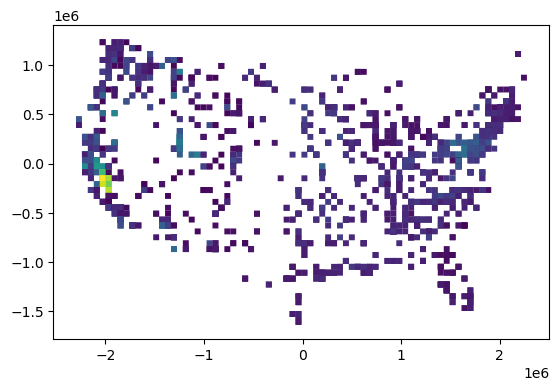

(365, 50, 80)


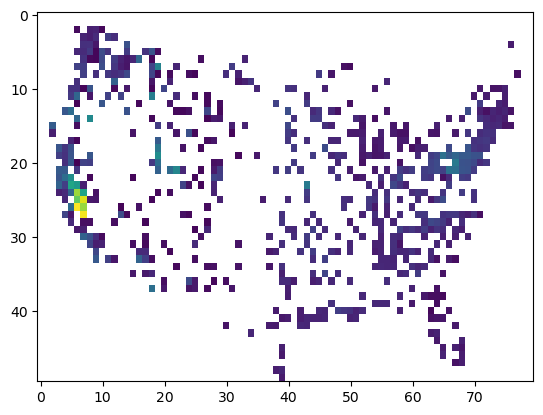

(365, 50, 80)

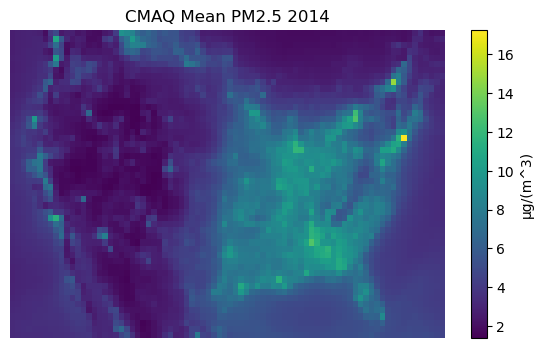

2015


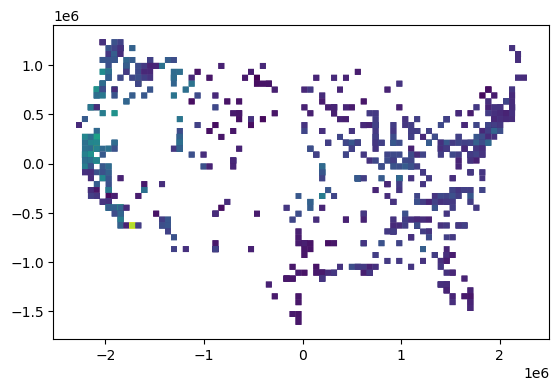

(365, 50, 80)


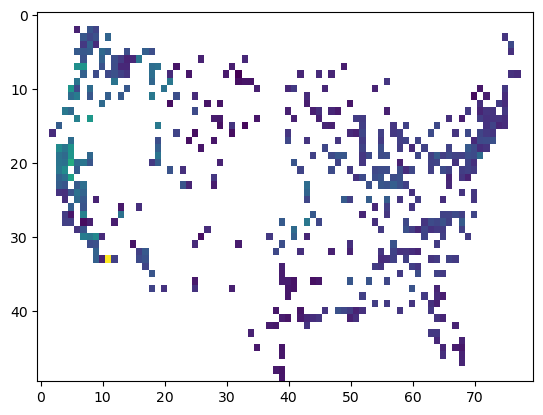

(365, 50, 80)

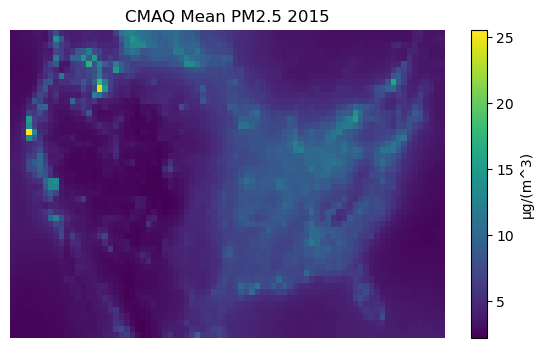

2016


/tmp/ipykernel_81453/724971003.py:7: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  PM25_88101 = pd.read_csv(f"PM2.5/daily_88101_{year}.zip")


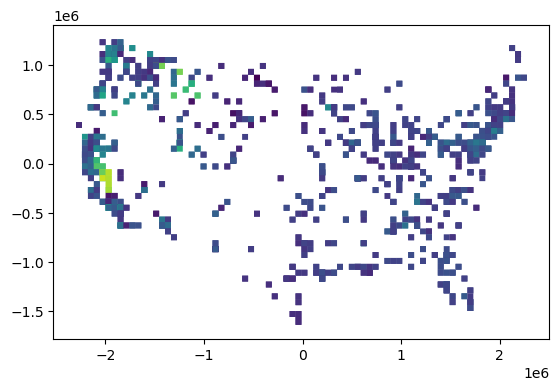

(366, 50, 80)


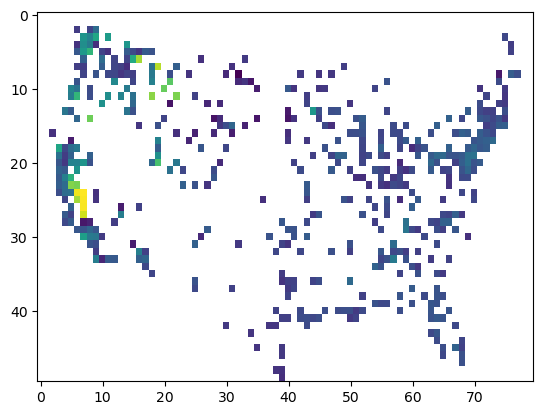

(366, 50, 80)

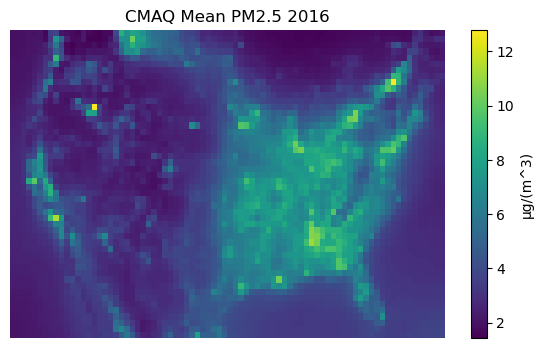

2017


/tmp/ipykernel_81453/724971003.py:7: DtypeWarning: Columns (13,27) have mixed types. Specify dtype option on import or set low_memory=False.
  PM25_88101 = pd.read_csv(f"PM2.5/daily_88101_{year}.zip")


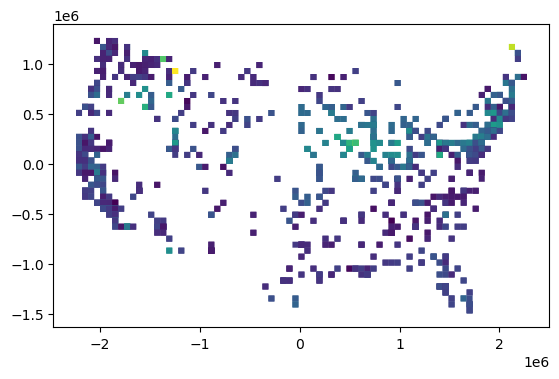

(365, 50, 80)


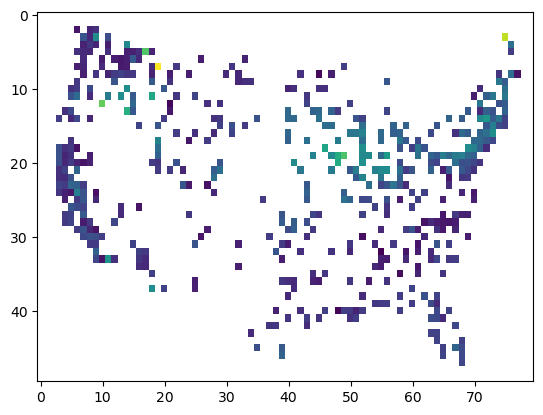

(365, 50, 80)

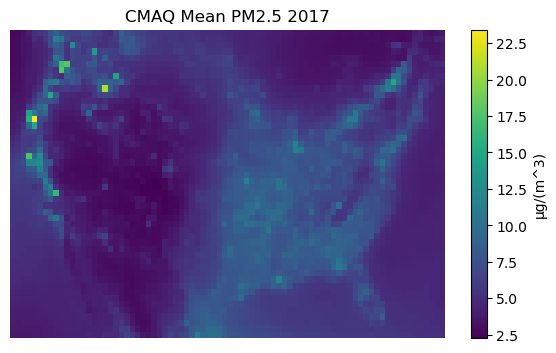

2018


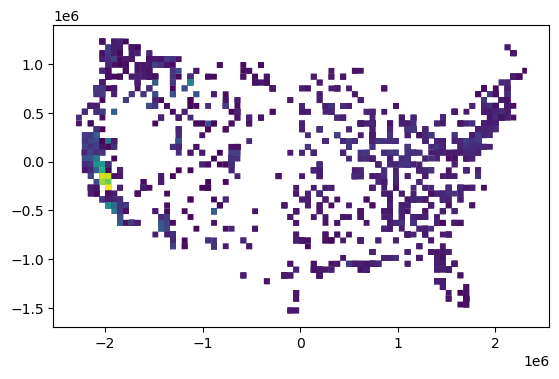

(365, 50, 80)


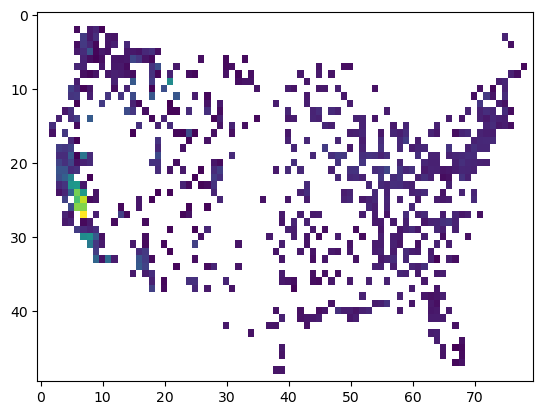

(365, 50, 80)

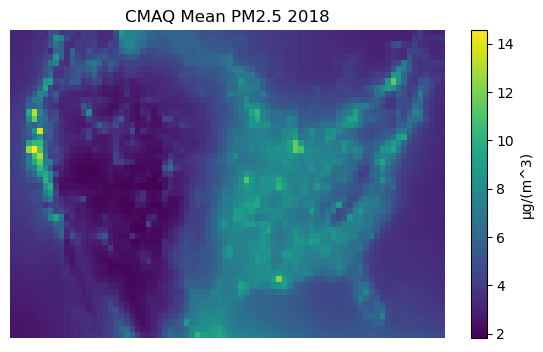

2019


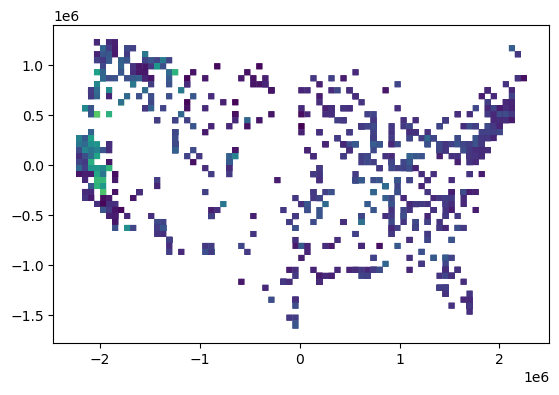

(365, 50, 80)


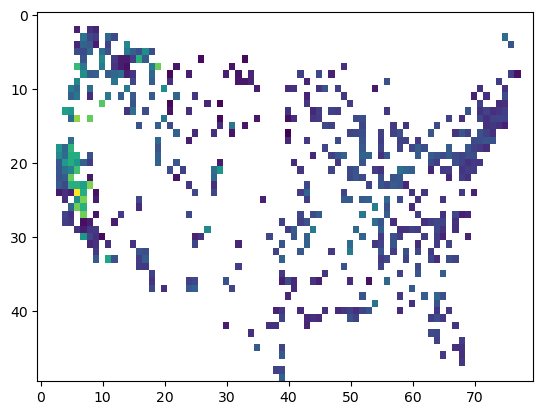

(365, 50, 80)

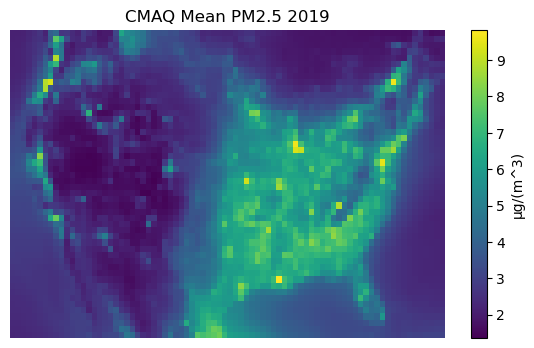

2020


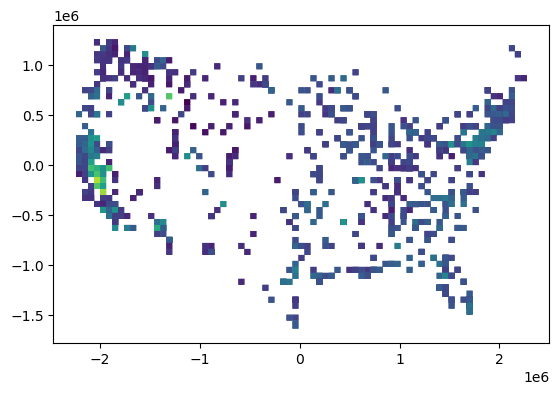

(366, 50, 80)


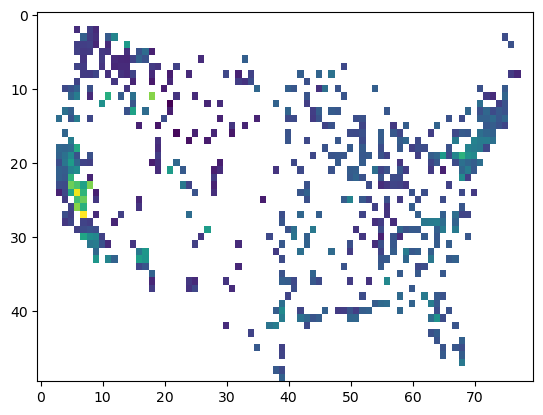

(366, 50, 80)

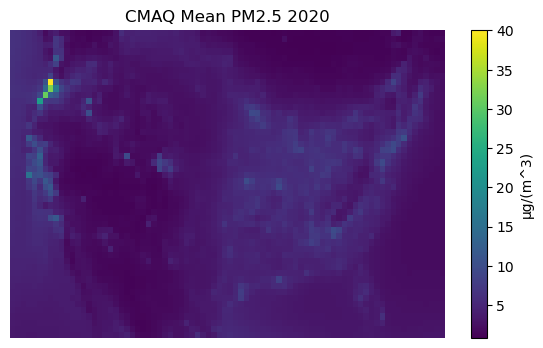

2021


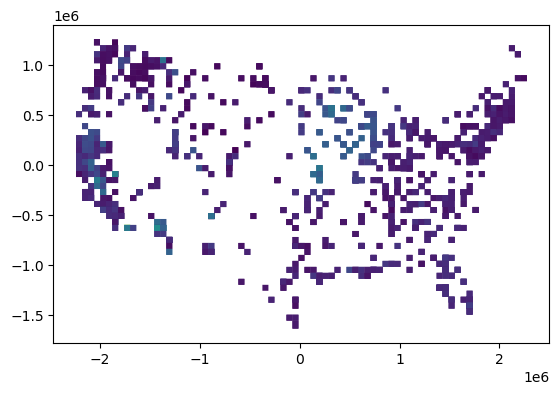

(365, 50, 80)


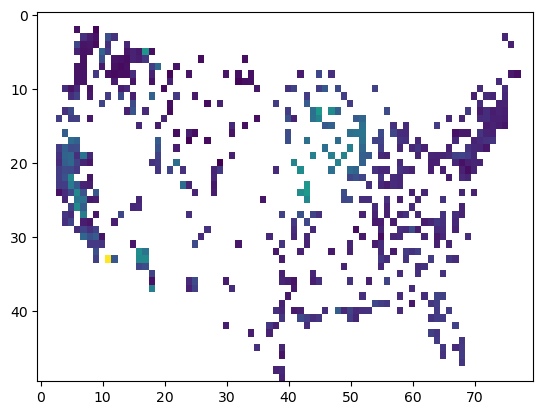

(365, 50, 80)

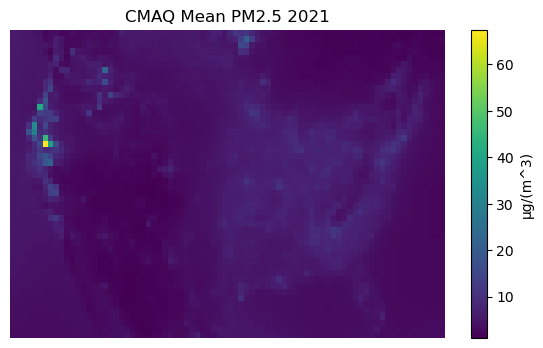

In [38]:
import itertools
for year in range(2010, 2021+1):
    print(year)
    cmaq = pd.read_csv(f"CMAQ/summarized/{year}_CMAQ_5x5.csv.gz")
    cmaqSquares = gpd.read_file(f"CMAQ/summarized/{year}_CMAQ_5x5_squares.shp")
    
    PM25_88101 = pd.read_csv(f"PM2.5/daily_88101_{year}.zip")
    PM25_88502 = pd.read_csv(f"PM2.5/daily_88502_{year}.zip", low_memory=False)
    
    PM25 = pd.concat((PM25_88101, PM25_88502))
    
    PM25geo = to_gdf(PM25, 'Latitude', 'Longitude')
    
    # apparently the cmaqSquares are not in order so I can't put them into a rectangular matrix
    # i'll sort by the x and y values so that I can actually make a 2d array
    squareCentroids = gpd.GeoDataFrame({'i': list(cmaqSquares.index)}, geometry=cmaqSquares.centroid)
    type(squareCentroids)
    # squareCentroids.iloc[0:5,].plot(column='i')
    
    # based on what's above, there are rounding issues or small deviations
    # remove rounding errors (round within 0.02e6) 
    roundedX = (squareCentroids.geometry.x / 0.02e6).round() * 0.02e6
    roundedY = (squareCentroids.geometry.y / 0.02e6).round() * 0.02e6
    
    # Get the sorted indices by x, then y
    sorted_indices = sorted(range(len(cmaqSquares)), key=lambda i: (roundedX[i], -roundedY[i]))
    # display(sorted_indices)
    # # Reorder the GeoDataFrame
    sortedcmaqSquares = cmaqSquares.iloc[sorted_indices].reset_index(drop=True)
    sortedcmaqSquares['newFID'] = list(sortedcmaqSquares.index)
    # sortedcmaqSquares.explore(column='newFID')
    # plt.show()
    
    # taken from https://ofmpub.epa.gov/rsig/rsigserver?data/FAQSD/docs/2020_DS_Annual_Report.pdf
    # Lambert Conformal Projection with true latitudes at 33 and 45 N, coordinate center 97 W, 40 N, converted by ChatGPT to CRS string
    cmaqCRS = (
        "+proj=lcc "
        "+lat_1=33 +lat_2=45 "        # standard parallels
        "+lat_0=40 "                  # latitude of origin
        "+lon_0=-97 "                 # central meridian
        "+x_0=0 +y_0=0 "              # false easting/northing
        "+datum=WGS84 +units=m +no_defs"
    )
    
    cmaqPM = sortedcmaqSquares.sjoin(PM25geo.to_crs(cmaqCRS), how='left')
    
    # clear_except('cmaqPM', 'cmaq', 'sortedcmaqSquares', 'pd', 'plt', 'np', 'gpd', 'year')
    
    cmaqPM[cmaqPM['Date Local'] == f'{year}-01-02'].plot(column="Arithmetic Mean")
    plt.show()
    
    cmaqPM = cmaqPM.dropna(subset=('Date Local'))

    # print(pd.unique(cmaqPM['Date Local']))
    
    PM_array = makePMarr(cmaqPM, year)
    # (days, rows, columns)
    print(PM_array.shape) 
    
    (~np.isnan(PM_array)).sum()
    
    plt.imshow(PM_array[1], cmap='viridis', aspect='auto')
    plt.show()
    
    np.save(f'PM2.5/{year}PM_array.npy', PM_array)
    
    # form the CMAQ 3D array for 2010
    
    # add newFID values to original cmaq data table
    cmaqWithSortedSquares = pd.merge(cmaq, sortedcmaqSquares, left_on='index_right', right_on='FID')
    cmaqWithSortedSquares = cmaqWithSortedSquares[['Date', 'newFID', 'Conc']].sort_values(['Date', 'newFID'])

    # print(pd.unique(cmaqWithSortedSquares['Date']))
    
    # Pivot the dataframe
    cmaqpivoted = cmaqWithSortedSquares.pivot(index='Date', columns='newFID', values='Conc')

    pd.DataFrame({'Date': cmaqpivoted.index}).to_csv(f'CMAQ/{year}cmaqdates.csv', index=False)
    
    # convert to a 3D array
    # honestly not entirely sure why I reshape to (365, 80, 50) first, then have to transpose it, but whateva
    cmaq3D_array = cmaqpivoted.values.reshape(len(cmaqpivoted), 80, 50)  
    cmaq3D_array = np.transpose(cmaq3D_array, axes=(0, 2, 1)) # fix to 50 rows and 80 columns
    
    # (days, rows, columns)
    display(cmaq3D_array.shape) 
    
    (np.isnan(cmaq3D_array)).sum()
    
    plt.figure(figsize=(7,4))
    plt.title(f"CMAQ Mean PM2.5 {year}")
    plt.imshow(np.mean(cmaq3D_array, axis=0), cmap='viridis', aspect='auto')
    plt.colorbar(label = 'µg/(m^3)')
    plt.axis('off')
    plt.savefig(f'CMAQmeanpm2.5values{year}.png', dpi=300, bbox_inches = 'tight')
    plt.show()
    
    np.save(f'CMAQ/{year}cmaq3D_array.npy', cmaq3D_array)